# TP3 - Intégration multiple numérique

### CACHEUX Nolan , MONTUORI Milo , DENIS Guillaume

<div class="alert-info">

   #### Question 1

Question 1 : avec la commande implicit_plot3d, visualisez le donut de paramètre $R= 1$ et $r= 0.5$.
    
</div>

In [6]:
R = 1
r = 0.5

x,y,z = var("x,y,z") # defines  symbolic  variables
    
f(x,y,z) = (R-sqrt(x**2+y**2))**2 + z**2 - r**2 # defines a function

implicit_plot3d(f(x,y,z), (x,-1.5,1.5), (y,-1.5,1.5),(z,-0.5,0.5),aspect_ratio=1, plot_points=50)

Graphics3d Object

<div class="alert-info">

   #### Question 2

Implémenter numériquement cette méthode en définissant une fonction $MC3D(n)$ renvoyant une estimation du volume du donut en fonction du nombre de points n tirés aléatoirement. Portez sur un graphe l’estimation du volume en fonction de n et commentez.
    
</div>

Graphics3d Object

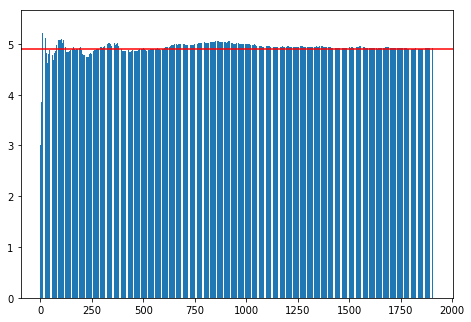

Estimation du volume en fonction de n :  4.90534744066343


In [7]:
import random

def mc3d(n):
    
    #Pave :
    intervalle_x = [-1.5,1.5] 
    intervalle_y = [-1.5,1.5] 
    intervalle_z = [-0.5,0.5] 
    
    #[-1.5,1.5] x [-1.5,1.5] x [-0.5,0.5] 
    volume_pave = (intervalle_x[1]-intervalle_x[0])*(intervalle_y[1]-intervalle_y[0])*(intervalle_z[1]-intervalle_z[0])
    
    m = 0 #on compte le nombre de point tombant dans S 
    
    x,y,z = var("x,y,z") # defines  symbolic  variables
    
    #on affiche un pavé vide tel que P appartient à [-1.5,1.5] x [-1.5,1.5] x [-0.5,0.5] 
    img = implicit_plot3d(0, (x,intervalle_x[0],intervalle_x[1]), 
                          (y,intervalle_y[0],intervalle_y[1]),
                          (z,intervalle_z[0],intervalle_z[1]),aspect_ratio=1, plot_points=50)

    
    tab = []
    tabn = []
    #on affiche chaque point de la fonction, enregistré dans Pf, ici des ronds rouges
    for i in range (1,n):

        x = random.uniform(intervalle_x[0],intervalle_x[1]) 
        y = random.uniform(intervalle_y[0],intervalle_y[1])
        z = random.uniform(intervalle_z[0],intervalle_z[1])
        #On prend des points aléatoirement compris 
        #dans le Pavé P : [-1.5,1.5] x [-1.5,1.5] x [-0.5,0.5] 
        
        
        if (f(x,y,z)<=0): 
            img+= point3d((x,y,z), size=5, color='blue')
            
            tab.append(m/i * volume_pave)
            tabn.append(m)
            m+=1
        
        else:
            img+= point3d((x,y,z), size=5, color='red')
    
    show(img) #Graphe portant l’estimation du volume en fonction de n
    
    #Ajout des librairies permettant l'affichage du graph.
    import matplotlib.pyplot as plt
    
    #Initialisation des données du graph
    fig = plt.figure()
    ax = fig.add_axes([0,0,1,1])
    
    #Ajouts des valeurs en X et Y, ici le volume en fonction du nombre d'itérations
    ax.bar(tabn,tab)
    
    #Ajout d'un ligne horizontal permettant la visualisation de la derniere valeur calculée
    plt.axhline(y = tab[-1], color = 'r', linestyle = '-')
    plt.show()
    
    
    return tab[-1]

    #OU
    
    #return m/n * volume_pave 
    #volume approximatif de S, notre donut

print("Estimation du volume en fonction de n : ",mc3d(3500))


Plus on augmente le nombre de points plus l’approximation est précise et on tend de + en + vers le volume exact du donut, l'approximation étant basée sur m/n * volume_pave, le volume du pavé est la limite quand n tend vers +infini.

<div class="alert-info">

   #### Question 3

implémenter la fonction MC2D correspondant à la méthode Monte-Carlo 2D. Comparer par rapport à Monte-Carlo 3D.
</div>

$z = g(x,y)$

$g(P_i)$ correspond à la hauteur du donut en ce point , comme nous travaillons
avec le plan $z = 0$, $g$ est égal à la somme entre la hauteur au dessus du plan jusque la surface du donut 
et la hauteur en dessous du plan jusque la surface du donut , on aura donc la hauteur du donut en $Pi$  
    
On cherche donc $z$ tel que : 
$$f(x,y,z) = 0 => (R-\sqrt{x^2+y^2})^2 + z^2 - r^2 = 0 =>$$ $$ z_1 = \sqrt{r^2-(R-\sqrt{y^2+x^2})^2)} \textrm{      OU       }  z_2 =  - \sqrt{r^2-(R-\sqrt{y^2+x^2})^2}$$
    
Donc : $$g(x,y) = z_1 - z_2 = 2*\sqrt{r^2-(R-\sqrt{y**2+x**2})**2}$$

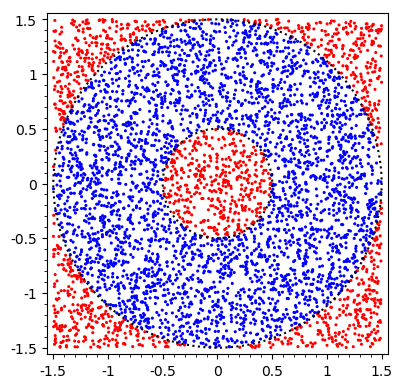

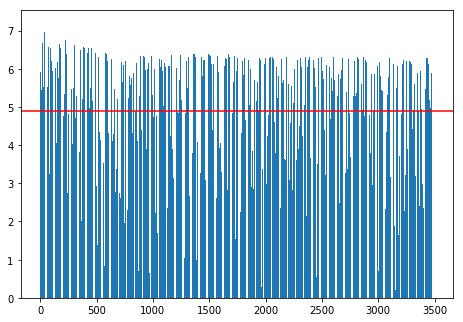

Estimation du volume en fonction de n :  4.90642565277864


In [11]:
import random
def mc2d(n):
    
    #Pave :
    intervalle_x = [-1.5,1.5] 
    intervalle_y = [-1.5,1.5] 
    intervalle_z = [-0.5,0.5] 
    
    hauteur = (intervalle_z[1]-intervalle_z[0])
    #[-1.5,1.5] x [-1.5,1.5] x [-0.5,0.5] 
    volume_pave = (intervalle_x[1]-intervalle_x[0])*(intervalle_y[1]-intervalle_y[0])*(intervalle_z[1]-intervalle_z[0])
    
    aire_rectangle = (intervalle_x[1]-intervalle_x[0])*(intervalle_y[1]-intervalle_y[0])
    
    m = 0 #on compte le nombre de point tombant dans S 
    
    x,y,z = var("x,y,z") # defines  symbolic  variables
    
    #on affiche un pavé vide tel que P appartient à [-1.5,1.5] x [-1.5,1.5] x [-0.5,0.5] 
    img = implicit_plot(f(x,y,0), (x,intervalle_x[0],intervalle_x[1]), 
                          (y,intervalle_y[0],intervalle_y[1]),
                          aspect_ratio=1, plot_points=50, color="black",linestyle=':')
    
    tab = []
    tabn = []
    
    g_Pi = 0
    #on affiche chaque point de la fonction, enregistré dans Pf, ici des ronds rouges
    for i in range (1,n):

        x = random.uniform(intervalle_x[0],intervalle_x[1]) 
        y = random.uniform(intervalle_y[0],intervalle_y[1])
        #On prend des points aléatoirement compris 
        #dans le Pavé P : [-1.5,1.5] x [-1.5,1.5] x [-0.5,0.5] 
        
        
        if (f(x,y,0)<=0): 
            img+= point2d((x,y), size=5, color='blue')
            hauteur = 2*sqrt(r**2-(R-sqrt(y**2+x**2))**2)
            g_Pi += hauteur
            tab.append((aire_rectangle/(i)) * m * hauteur)
            tabn.append(m)
            m+=1
        
        else:
            img+= point2d((x,y), size=5, color='red')
    
    # affichage de img, ici la visualisation de la somme de Reimann
    show(img)
    
    #Ajout des librairies permettant l'affichage du graph.
    import matplotlib.pyplot as plt
    
    #Initialisation des données du graph
    fig = plt.figure()
    ax = fig.add_axes([0,0,1,1])
    
    #Ajouts des valeurs en X et Y, ici le volume en fonction du nombre d'itérations
    ax.bar(tabn,tab)
    
    #Ajout d'un ligne horizontal permettant la visualisation de la derniere valeur calculée
    plt.axhline(y = aire_rectangle/n * g_Pi, color = 'r', linestyle = '-')
    plt.show()
    
    
    return aire_rectangle/n * g_Pi
    

print("Estimation du volume en fonction de n : ",mc2d(5000))


<div class="alert-info">

   #### Question 4

implémenter la méthode dans une fonction Riemann (m,n) et observer numériquement la convergence quand m, n→+∞. On pourra prendre m= 2n pour simplifier.
    
</div>

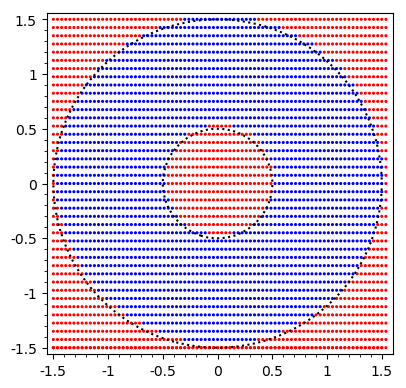

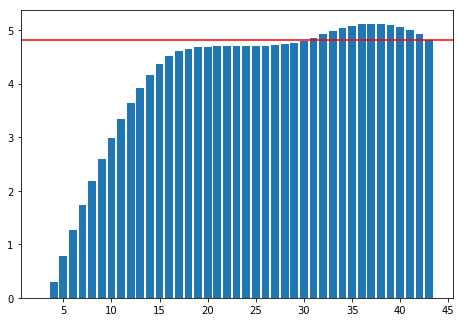

Estimation du volume en fonction de n :  4.81566053710428


In [9]:
def Riemann(m,n):
    
        
    #Pave :
    intervalle_x = [-1.5,1.5] 
    intervalle_y = [-1.5,1.5] 
    intervalle_z = [-0.5,0.5] 
    
    hauteur = (intervalle_z[1]-intervalle_z[0])
    #[-1.5,1.5] x [-1.5,1.5] x [-0.5,0.5] 
    volume_pave = (intervalle_x[1]-intervalle_x[0])*(intervalle_y[1]-intervalle_y[0])*(intervalle_z[1]-intervalle_z[0])
    
    aire_rectangle = (intervalle_x[1]-intervalle_x[0])*(intervalle_y[1]-intervalle_y[0]) 
    
    x,y,z = var("x,y,z") # defines  symbolic  variables
    
    #on affiche un pavé vide tel que P appartient à [-1.5,1.5] x [-1.5,1.5] x [-0.5,0.5] 
    img = implicit_plot(f(x,y,0), (x,intervalle_x[0],intervalle_x[1]), 
                          (y,intervalle_y[0],intervalle_y[1]),
                          aspect_ratio=1, plot_points=50, color="black",linestyle=':')

    
    #nous initialisons un pas qui correspond au nombre de division en X et Y par rapport au nombre d'itération et la taille de la grille.
    pasX = 3/m
    pasY = 3/n
    
    #la variable base permet de réinitialisé le X, ce qui permet de revenir "le long de l'axe Y" a chaque boucle.
    base = -1.5
    
    #les variables suivantes permettent la réinistialisation des pas, au cours du temps (donc des boucles)
    o = 0
    p = 0
    x = base
    y = base
    
    #initialisation de 2 tableaux pour la visualisation des résultats (le graph). la variable K permet le comptage des boucles
    k = 1
    tab = []
    tabn = []
    
    #initialisation d'une variable permettant le calcul total du volume.
    g_Pi = 0
    
    #Les boucles suivantes sont utiles aux traitements de tous les "batonnets" en fonction du pas, donc des variables n et m
    for i in range(n+2):
        for j in range(m+2):
            
            #Conditions pour savoir si le "batonnet" actuel est présent DANS le donut
            if (f(x-(pasX/2),y-(pasY/2),0)<=0):
                
                #Si oui, ajout du volume du batonnet a la variable de volume total
                # et on imprime un point bleu
                img+= point2d((x,y), size=5, color='blue')
                g_Pi += 2*sqrt(r**2-(R-sqrt((x-(pasX/2))**2+(y-(pasY/2))**2))**2)
                 
            #Sinon, on place un point rouge.
            else:
                img+= point2d((x,y), size=5, color='red')
                
            # on ajoute le pas en X, et on recommence le calcul
            x = base+o
            o += pasX
        
        # A la fin de la ligne, retour à la "base", donc à x = 0  (ici, -1.5)
        o = 0
        y = base+p
        p += pasY
        
        
        #Pour chaque "ligne de batonnets", on calcul le volume
        val = (aire_rectangle/(i*m)) *g_Pi
        
        #On ajoute les valeurs au tableau pour l'affichage du graph ensuite.
        k+= 1
        tab.append(val)
        tabn.append(k)
        
    # affichage de img, ici la visualisation de la somme de Riemann
    show(img)
    
    #Ajout des librairies permettant l'affichage du graph.
    import matplotlib.pyplot as plt
    
    #Initialisation des données du graph
    fig = plt.figure()
    ax = fig.add_axes([0,0,1,1])
    
    #Ajouts des valeurs en X et Y, ici le volume en fonction du nombre d'itérations
    ax.bar(tabn,tab)
    
    #Ajout d'un ligne horizontal permettant la visualisation de la derniere valeur calculée
    plt.axhline(y = tab[-1], color = 'r', linestyle = '-')
    plt.show()
    
    
    return tab[-1]
    

print("Estimation du volume en fonction de n : ",Riemann(80,40))